# Lane formation in bi-directional flow
[Link to tutorial](https://www.jupedsim.org/stable/notebooks/lane-formation.html)

In [8]:
import pathlib

import jupedsim as jps
import matplotlib.pyplot as plt
import numpy as np
import pedpy
from shapely import Polygon

%matplotlib inline
import warnings

from jupedsim.internal.notebook_utils import animate, read_sqlite_file

In [9]:
length = 38
width = 3
area = [[0, 0], [length, 0], [length, width], [0, width]]
exit_polygon_left = [(0, 0), (1, 0), (1, width), (0, width)]
exit_polygon_right = [
    (length - 1, 0),
    (length, 0),
    (length, width),
    (length - 1, width),
]
distribution_polygon_left = Polygon([[0, 0], [12, 0], [12, width], [0, width]])
distribution_polygon_right = Polygon(
    [[length - 12, 0], [length, 0], [length, width], [26, width]]
)
measurement_area = pedpy.MeasurementArea([[14, 0], [24, 0], [24, 3], [14, 3]])
measurement_line_left = pedpy.MeasurementLine([[14, 0], [14, width]])
measurement_line_right = pedpy.MeasurementLine([[24, 0], [24, width]])
walkable_area = pedpy.WalkableArea(area)

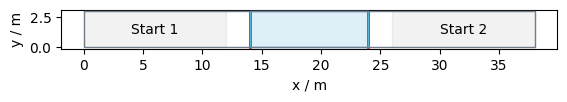

In [10]:
fig, ax = plt.subplots(nrows=1, ncols=1)
ax.set_aspect("equal")
pedpy.plot_measurement_setup(
    walkable_area=walkable_area,
    measurement_areas=[measurement_area],
    measurement_lines=[measurement_line_left, measurement_line_right],
    ml_color="red",
    ml_width=2,
    axes=ax,
)
for id, polygon in enumerate([distribution_polygon_left, distribution_polygon_right]): # for every element, num element and element
    x, y = polygon.exterior.xy
    plt.fill(x, y, alpha=0.1, color="gray")
    centroid = polygon.centroid
    plt.text(
        centroid.x,
        centroid.y,
        f"Start {id+1}",
        ha="center",
        va="center",
        fontsize=10,
    )

## Definition of the simulation scenarios

In [11]:
simulations = {}
COLUMNS = 9
number_agents = [
    (6 * COLUMNS, 0 * COLUMNS),
    (5 * COLUMNS, 1 * COLUMNS),
    (4 * COLUMNS, 2 * COLUMNS),
    (3 * COLUMNS, 3 * COLUMNS),
]
for number in number_agents:
    trajectory_file = f"../../sqlite_data/trajectories_number_agents_{number}.sqlite"
    simulation = jps.Simulation(
        dt=0.05, # time interval per iteration
        model=jps.CollisionFreeSpeedModel(
            strength_neighbor_repulsion=2.6,
            range_neighbor_repulsion=0.1,
            range_geometry_repulsion=0.05,
        ),
        geometry=walkable_area.polygon,
        trajectory_writer=jps.SqliteTrajectoryWriter(
            output_file=pathlib.Path(trajectory_file),
        ),
    )
    simulations[number] = simulation

## Initialisation of the simulation and distribution of agents

In [12]:
right_wing = {}
left_wing = {}

for number, simulation in simulations.items():
    exits = [
        simulation.add_exit_stage(exit_polygon_left),
        simulation.add_exit_stage(exit_polygon_right),
    ]
    journeys = [
        simulation.add_journey(jps.JourneyDescription([exit])) for exit in exits
    ]

    # first group
    positions = jps.distribute_by_number(
        polygon=distribution_polygon_right,
        number_of_agents=number[1],
        distance_to_agents=0.4,
        distance_to_polygon=0.7,
        seed=45131502,
    )
    group1 = set(
        [
            simulation.add_agent(
                jps.CollisionFreeSpeedModelAgentParameters(
                    position=position,
                    journey_id=journeys[0],
                    stage_id=exits[0],
                )
            )
            for position in positions  # for every agent
        ]
    )

    # second group
    positions = jps.distribute_by_number(
        polygon=distribution_polygon_left,
        number_of_agents=number[0],
        distance_to_agents=0.4,
        distance_to_polygon=0.7,
        seed=45131502,
    )

    group2 = set(
        [
            simulation.add_agent(
                jps.CollisionFreeSpeedModelAgentParameters(
                    position=position,
                    journey_id=journeys[1],
                    stage_id=exits[1],
                )
            )
            for position in positions
        ]
    )

    right_wing[number] = group1
    left_wing[number] = group2

<built-in method items of dict object at 0x000002E7863219C0>
(54, 0)
(45, 9)
(36, 18)
(27, 27)


## Running simulations

In [16]:
trajectory_files = {}
for number, simulation in simulations.items():
    while simulation.agent_count() > 0 and simulation.iteration_count() < 3000:
        simulation.iterate()

    trajectory_file = f"../../sqlite_data/trajectories_number_agents_{number}.sqlite"
    trajectory_files[number] = trajectory_file

## Visualisation of the simulation results

In [19]:
agent_trajectories = {}
for number in number_agents:
    trajectory_file = trajectory_files[number]
    agent_trajectories[number], walkable_area = read_sqlite_file(
        trajectory_file
    )
    animate(
        agent_trajectories[number],
        walkable_area,
        every_nth_frame=5,
        width=800,
        height=400,
        title_note=f"Ratio: {min(number)/sum(number):0.2f}",
    ).show()

## Analisys

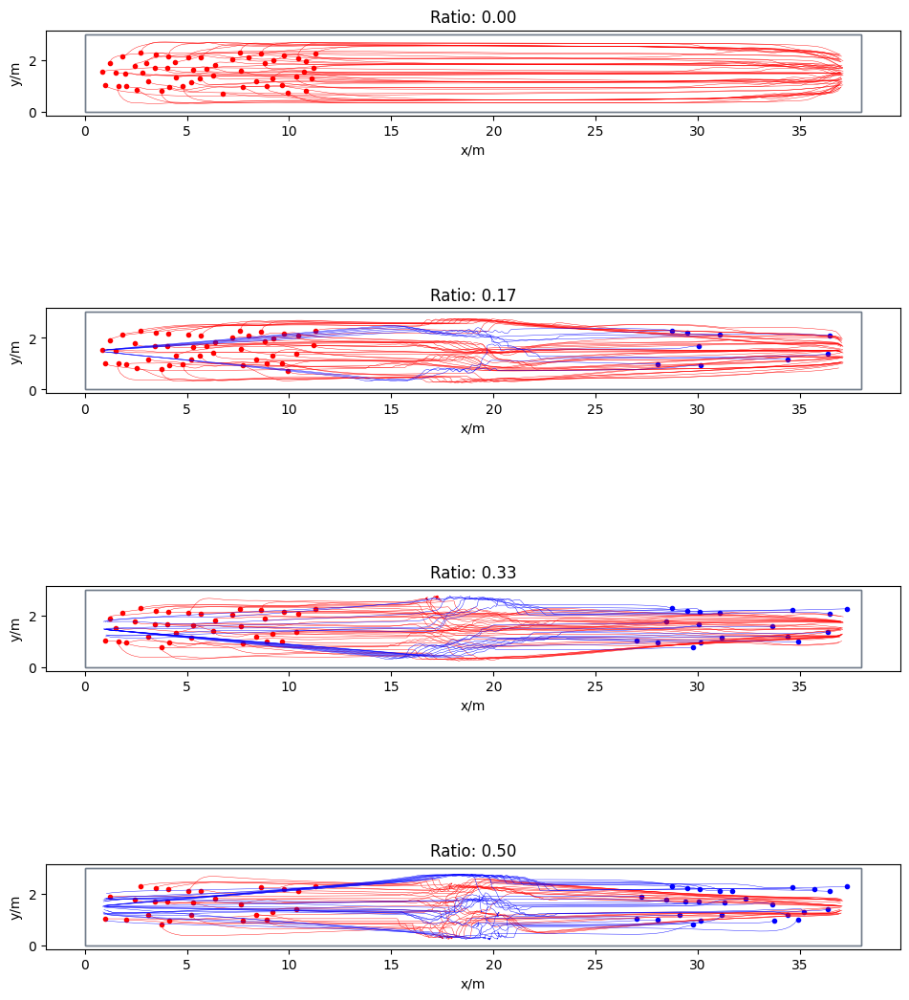

In [23]:
fig, axes = plt.subplots(
    nrows=len(number_agents), ncols=1, height_ratios=[5, 5, 5, 5]
)
axes = np.atleast_1d(axes)
colors = ["red", "blue"]
for ax, number in zip(axes, number_agents):
    trajectories = agent_trajectories[number].data
    for ig, group in enumerate([left_wing[number], right_wing[number]]): # left_wing is number 1 and right_wing number 2
        traj = pedpy.TrajectoryData(
            trajectories[trajectories["id"].isin(group)],
            frame_rate=agent_trajectories[number].frame_rate,
        )
        pedpy.plot_trajectories(
            traj=traj,
            walkable_area=walkable_area,
            axes=ax,
            traj_color=colors[ig],
            traj_width=0.3,
            traj_start_marker=".",
        )
        ax.set_title(f"Ratio: {min(number)/sum(number):.2f}")
plt.tight_layout()
fig.set_size_inches((10, 12))
plt.show()

## Voronoi-based measurements

To calculate the the density

In [24]:
warnings.filterwarnings("ignore")

individual = {}
density_voronoi = {}

for number in number_agents:
    individual[number] = pedpy.compute_individual_voronoi_polygons(
        traj_data=agent_trajectories[number], walkable_area=walkable_area
    )
    density_voronoi[number], intersecting = pedpy.compute_voronoi_density(
        individual_voronoi_data=individual[number],
        measurement_area=measurement_area,
    )

### Density

In [25]:
density_voronoi_ = {}

for number in number_agents:
    individual[number] = pedpy.compute_individual_voronoi_polygons(
        traj_data=agent_trajectories[number], walkable_area=walkable_area
    )
    density_voronoi[number], intersecting = pedpy.compute_voronoi_density(
        individual_voronoi_data=individual[number],
        measurement_area=measurement_area,
    )

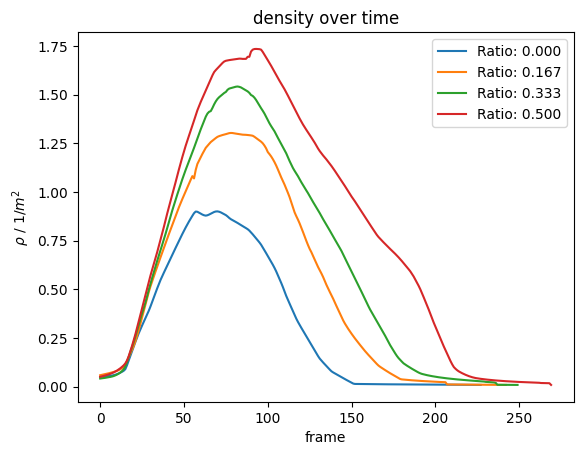

In [26]:
fig0, ax0 = plt.subplots(nrows=1, ncols=1)
labels = []
colors = plt.rcParams["axes.prop_cycle"].by_key()["color"]
for i, number in enumerate(number_agents):
    pedpy.plot_density(
        density=density_voronoi[number], axes=ax0, color=colors[i]
    )
    labels.append(f"Ratio: {min(number)/sum(number):.3f}")

ax0.legend(labels)
plt.show()

## Speed

In [27]:
speed_r = {}
speed_l = {}
mean_speed_r = {}
mean_speed_l = {}
for number in number_agents:
    traj = agent_trajectories[number]
    fps = agent_trajectories[number].frame_rate
    df = traj.data
    group1 = left_wing[number]
    group2 = right_wing[number]
    df_r = df[df["id"].isin(group2)]
    df_l = df[df["id"].isin(group1)]

    if not df_r.empty:
        df_r = pedpy.TrajectoryData(df_r, fps)
        speed_r[number] = pedpy.compute_individual_speed(
            frame_step=5,
            movement_direction=[-1, 0],
            traj_data=df_r,
            compute_velocity=True,
            speed_calculation=pedpy.SpeedCalculation.BORDER_SINGLE_SIDED,
        )
        mean_speed_r[number] = pedpy.compute_mean_speed_per_frame(
            traj_data=df_r,
            measurement_area=measurement_area,
            individual_speed=speed_r[number],
        )

    if not df_l.empty:
        df_l = pedpy.TrajectoryData(df_l, fps)
        speed_l[number] = pedpy.compute_individual_speed(
            frame_step=5,
            movement_direction=[1, 0],
            traj_data=df_l,
            compute_velocity=True,
            speed_calculation=pedpy.SpeedCalculation.BORDER_SINGLE_SIDED,
        )
        mean_speed_l[number] = pedpy.compute_mean_speed_per_frame(
            traj_data=df_l,
            measurement_area=measurement_area,
            individual_speed=speed_l[number],
        )

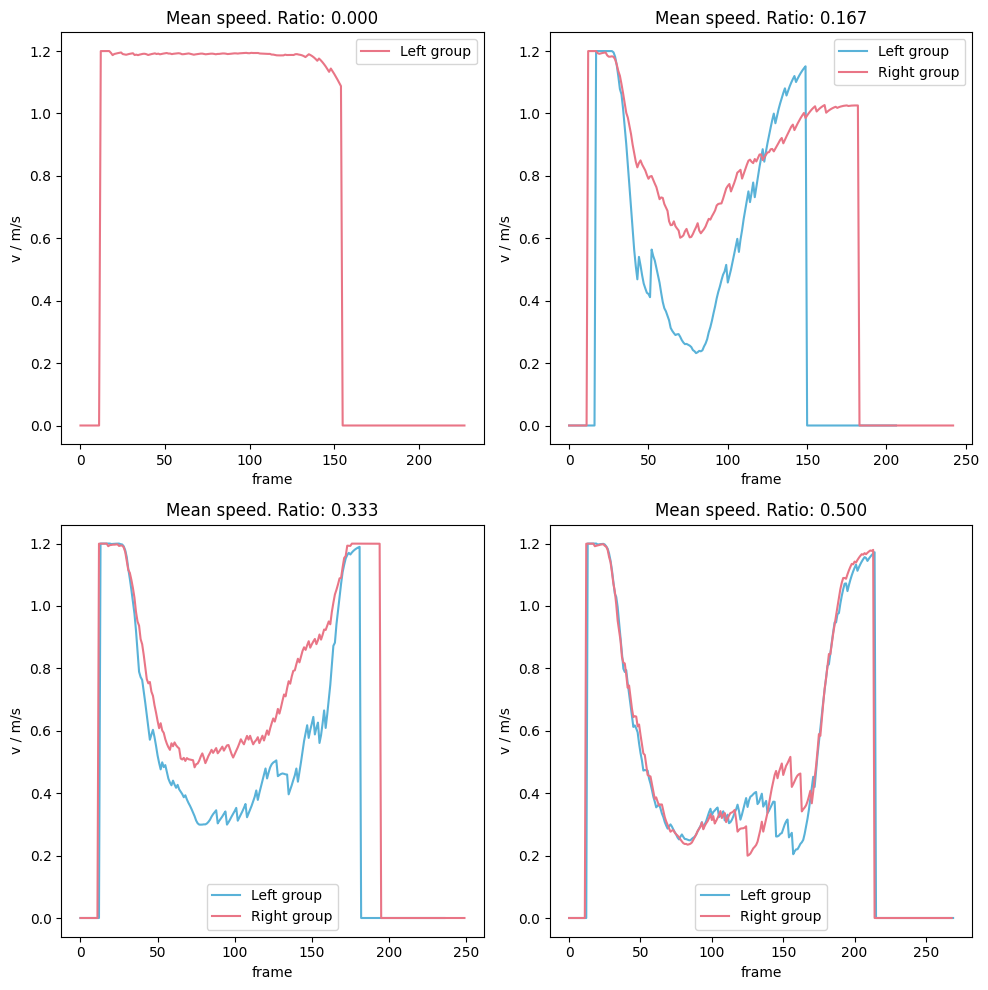

In [28]:
fig0, ((ax1, ax2), (ax3, ax4)) = plt.subplots(
    nrows=2, ncols=2, figsize=(10, 10)
)
axes = [ax1, ax2, ax3, ax4]

for ax, number in zip(axes, number_agents):
    if number in mean_speed_r:
        pedpy.plot_speed(
            speed=mean_speed_r[number],
            axes=ax,
            title=f"Mean speed. Ratio: {min(number)/sum(number):.3f}",
            color=pedpy.PEDPY_BLUE,
        )

    if number in mean_speed_l:
        pedpy.plot_speed(
            speed=mean_speed_l[number],
            title=f"Mean speed. Ratio: {min(number)/sum(number):.3f}",
            axes=ax,
            color=pedpy.PEDPY_RED,
        )
    ax.legend(["Left group", "Right group"])

plt.tight_layout()
plt.show()

## Evacuation time vs Ratios

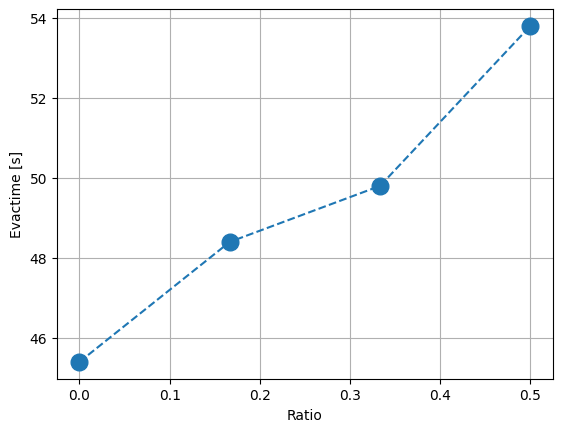

In [29]:
evac_times = {}
for i, number in enumerate(number_agents):
    trajectories = agent_trajectories[number].data
    fps = agent_trajectories[number].frame_rate
    evac_time = trajectories["frame"].max() / fps
    ratio = min(number) / sum(number)
    evac_times[ratio] = evac_time

plt.plot(list(evac_times.keys()), list(evac_times.values()), "o--", ms=12)
plt.xlabel("Ratio")
plt.ylabel("Evactime [s]")
plt.grid()
plt.show()